# 🛣️ Pothole Detection using YOLOv11

### Developed by:
- Naresh Kumar T A

Department of Artificial Intelligence & Machine Learning


## 📖 Project Overview

This project aims to detect potholes, road cracks, and normal road surfaces using the YOLOv11 object detection model. The model is trained on a custom dataset exported from Roboflow and can identify road damages from uploaded images.

## 🎯 Objectives

- Detect potholes on road surfaces
- Detect road cracks
- Classify normal road areas
- Demonstrate an AI-based road damage detection system


## 📂 Dataset

Source: Roboflow

Classes:
- Pothole
- Crack
- Normal Road

Total Images: 810

Training Images: 592

Validation Images: 127

Testing Images: 91

## 📚 Libraries Used

- Python
- PyTorch
- Ultralytics YOLOv11
- Roboflow
- OpenCV
- NumPy
- Matplotlib

In [1]:
import torch

print("PyTorch Version:", torch.__version__)
print("GPU Available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("No GPU detected!")

PyTorch Version: 2.11.0+cu128
GPU Available: True
GPU Name: Tesla T4


In [2]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 36.7 MB/s eta 0:00:00


## Step 1: Install Required Libraries


In [3]:
from ultralytics import YOLO
import torch
import cv2
import matplotlib.pyplot as plt
import os
import yaml
import random
import pandas as pd

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
from ultralytics import checks

checks()

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 46.7/112.6 GB disk)


In [5]:
!pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.9/276.9 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 39.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 42.0 MB/s eta 0:00:00


## Step 2: Download the Dataset from Roboflow

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="hBA5OCVngjeT8jTZ3Lfk")
project = rf.workspace("minal-v-g").project("pothhole-detection-sh45z-t9cjd")
version = project.version(1)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Pothhole-Detection-1 in yolov11:: 100%|██████████| 1625/1625 [00:07<00:00, 215.05it/s] 


In [7]:
print(dataset.location)

/content/Pothhole-Detection-1


In [8]:
import os

print(os.listdir(dataset.location))

['README.roboflow.txt', 'README.dataset.txt', 'train', 'test', 'data.yaml', 'valid']


In [9]:
import yaml
import os

yaml_path = os.path.join(dataset.location, "data.yaml")

with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

print(data)

{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 3, 'names': ['Crack', 'Normal Road', 'Pothhole'], 'roboflow': {'workspace': 'minal-v-g', 'project': 'pothhole-detection-sh45z-t9cjd', 'version': 1, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/minal-v-g/pothhole-detection-sh45z-t9cjd/dataset/1'}}


## Step 3: Train the YOLOv11 Model

In [10]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

model.train(
    data=os.path.join(dataset.location, "data.yaml"),
    epochs=50,
    imgsz=640,
    batch=16,
    device=0,
    name="pothole_detection"
)

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Pothhole-Detection-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=pothole_detection, nbs=64, nms=False, opset=None, optimize=False, optimize

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bb33ed448f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [11]:
from google.colab import files
import os

best_model = "/content/runs/detect/pothole_detection/weights/best.pt"

print(os.path.exists(best_model))

True


In [12]:
files.download(best_model)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [13]:
import os

train_images = os.path.join(dataset.location, "test", "images")
print(os.listdir(train_images)[:10])

['IMG_1866-1-_jpg.rf.85874d421996a8142ff32a5ef151545d.jpg', 'IMG_3366-1-_JPG.rf.09ba8f43c802cf1b758ca5b1455cea2b.jpg', 'crack-217-_JPG.rf.ac098ef4233278fa536ca6b1c99c4326.jpg', 'pothole-276-_jpg.rf.7fb224a61f5eff84c28781da346bc3e4.jpg', 'pothole-231-_jpg.rf.83dd7afca533a22156defa57ed543bb3.jpg', 'pothole-63-_JPG.rf.32d8efeb311394365c84cfeefd65bc02.jpg', 'pothole-62-_jpg.rf.d5c37c33b6019f208d762318886bf510.jpg', 'pothole-289-_jpg.rf.9d83515d7cbc5c095b3afbc8f9787bac.jpg', 'pothole-264-_jpg.rf.76b2f13d046ec32e8fcc2334ec801dd0.jpg', 'pothole-4-_JPG.rf.0fcd504f5454b0f084c0abb81e74bc7e.jpg']


In [14]:
import os
from ultralytics import YOLO

model = YOLO(best_model)

image_path = os.path.join(dataset.location, "test", "images",
                          "pothole-48-_JPG.rf.e40bb635f23d636c94174d286373ee33.jpg")

results = model.predict(
    source=image_path,
    conf=0.25,
    save=True
)


image 1/1 /content/Pothhole-Detection-1/test/images/pothole-48-_JPG.rf.e40bb635f23d636c94174d286373ee33.jpg: 480x640 (no detections), 56.1ms
Speed: 3.0ms preprocess, 56.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/predict


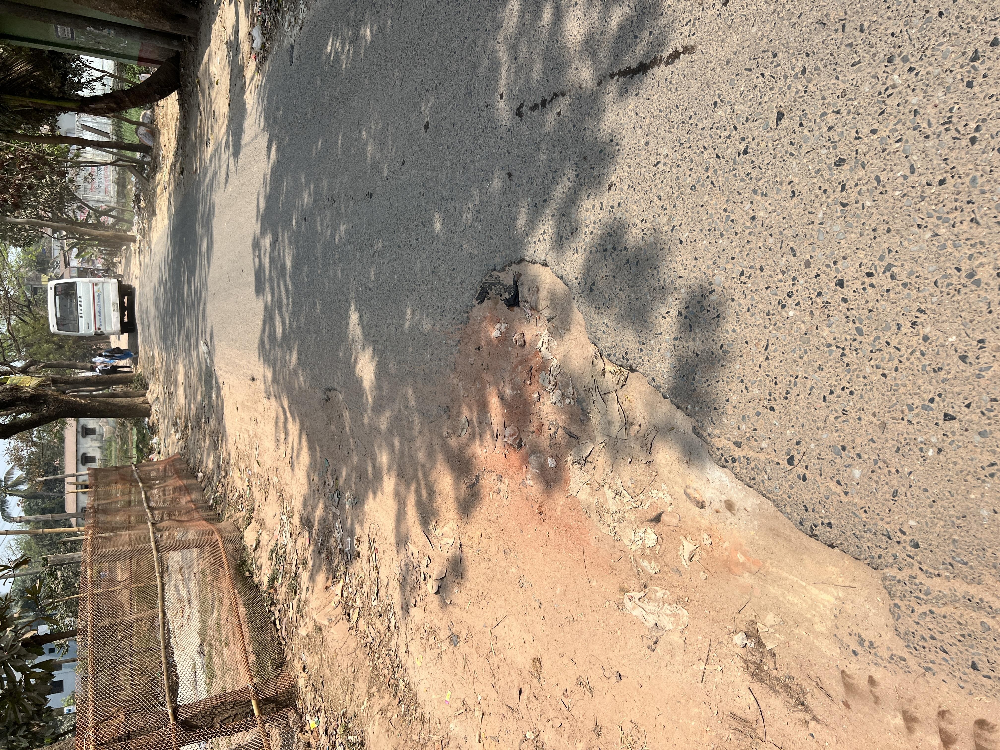

In [15]:
import glob
from IPython.display import Image, display

# latest prediction folder
pred_folder = sorted(glob.glob("/content/runs/detect/predict*"))[-1]

result_img = glob.glob(pred_folder + "/*.jpg")[0]

display(Image(filename=result_img))

## Step 4: Training Results

In [16]:
results = model.predict(
    source=image_path,
    conf=0.10,
    save=True
)


image 1/1 /content/Pothhole-Detection-1/test/images/pothole-48-_JPG.rf.e40bb635f23d636c94174d286373ee33.jpg: 480x640 (no detections), 21.1ms
Speed: 5.4ms preprocess, 21.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/predict


In [17]:
results = model.predict(
    source=image_path,
    conf=0.05,
    save=True
)


image 1/1 /content/Pothhole-Detection-1/test/images/pothole-48-_JPG.rf.e40bb635f23d636c94174d286373ee33.jpg: 480x640 (no detections), 17.8ms
Speed: 6.4ms preprocess, 17.8ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/predict


In [18]:
results = model.predict(
    source=image_path,
    conf=0.01,
    save=True,
    verbose=True
)


image 1/1 /content/Pothhole-Detection-1/test/images/pothole-48-_JPG.rf.e40bb635f23d636c94174d286373ee33.jpg: 480x640 6 Cracks, 43 Pothholes, 31.6ms
Speed: 10.7ms preprocess, 31.6ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/predict


## Step 5: Test the Trained Model

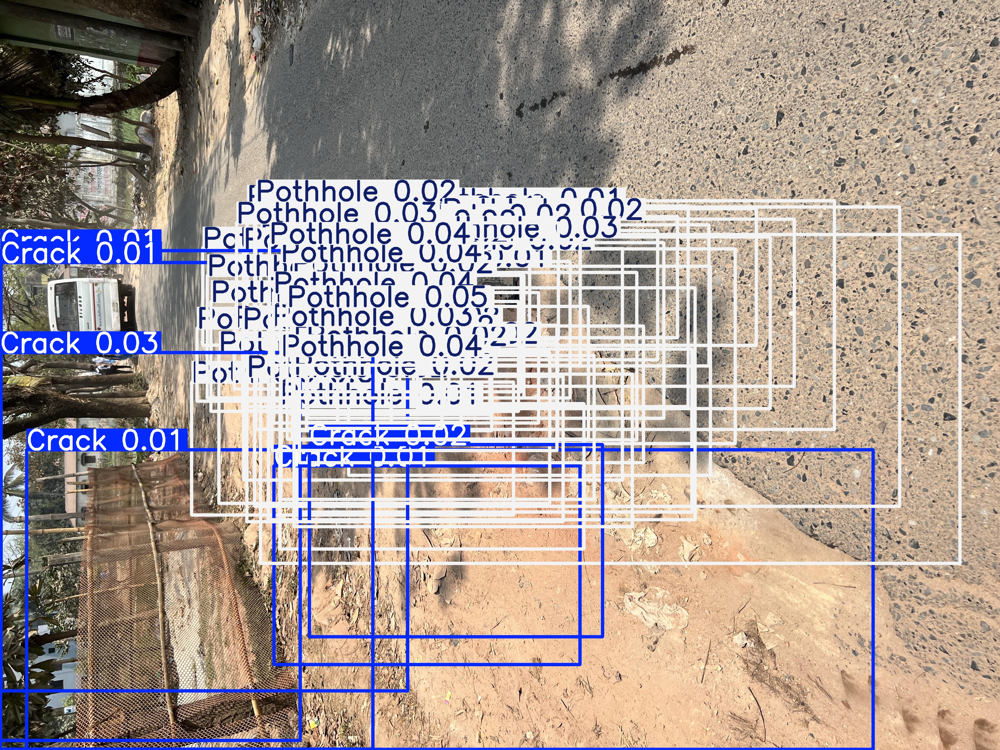

In [19]:
import glob
from IPython.display import Image, display

img = glob.glob("/content/runs/detect/predict/*.jpg")[0]
display(Image(filename=img))

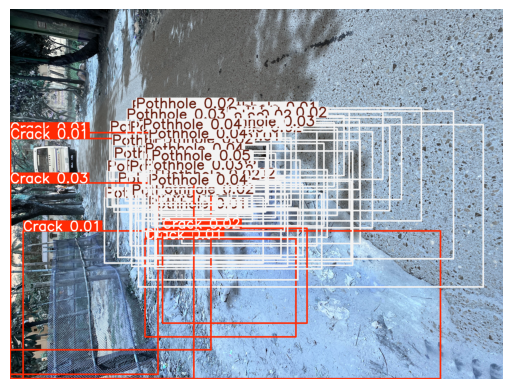

In [20]:
import matplotlib.pyplot as plt

img = results[0].plot()
plt.imshow(img)
plt.axis("off")
plt.show()

In [21]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/pothole_detection/weights/best.pt")

metrics = model.val()

print("Precision:", metrics.box.p)
print("Recall:", metrics.box.r)
print("mAP@50:", metrics.box.map50)
print("mAP@50-95:", metrics.box.map)

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2701.2±1972.3 MB/s, size: 2554.6 KB)
val: Scanning /content/Pothhole-Detection-1/valid/labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 127/127 35.5Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 9, len(boxes) = 240. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 2.0s/it 15.6s
                   all        127        240       0.72      0.504      0.556      0.377
                 Crack         44         65       0.59      0.308      0.374      0.182
           Normal Road      

In [22]:
print("Per-class Precision:", metrics.box.p)
print("Per-class Recall:", metrics.box.r)
print("Per-class mAP50:", metrics.box.maps)

Per-class Precision: [    0.59026     0.91763     0.65271]
Per-class Recall: [    0.30769     0.88889     0.31538]
Per-class mAP50: [    0.18157     0.75764     0.19058]


In [23]:
metrics.confusion_matrix.plot()

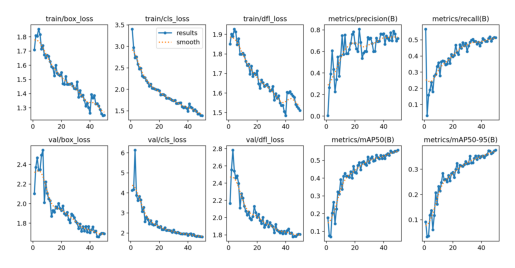

In [24]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread("/content/runs/detect/pothole_detection/results.png")
plt.imshow(img)
plt.axis("off")
plt.show()

## Conclusion

The YOLOv11 model was successfully trained to detect potholes, road cracks, and normal road surfaces. The project demonstrates the complete workflow from dataset preparation to model evaluation and prediction.